## 30.1 Unsupervised Capstone
___
Using NLP and Clustering to Categorize COVID Preprints


# The Data
___

The [dataset used](https://github.com/nicholasmfraser/covid19_preprints)  consists of preprints of COVID-related studies across multiple sources. Preprints are academic papers published online before they’ve gone through traditional peer review, and due to the immediacy of our collective situation, they have become a common way for scientists to disseminate their findings. So researchers Nicholas Fraser and Bianca Kramer have begun compiling a dataset of more than 7,000 COVID-19 preprints via multiple APIs (Crossref, DataCite, and arXiv). 

<br></br>
#### Details:
* For each paper, the dataset includes the title, abstract, DOI, date posted, and the hosting repository.
* Dataframe contains 7380 observations (papers) and 6 features, though we will create many more in the feature engineering portion


#### Problem Statement:
Due to the number of repositories in which papers are being published and the rate at which they are being published, it is difficult for scientists to compile them, sort through, or be notified when something of interest is published. Maybe a scientist is working on a solution that centers around locating the virus's accesspoint in human cells and is unconcerned about papers that are related to patient sympotoms or mental health. Maybe an American sociologist is interested in all findings related to the effects of the quarantine on the population and is uninterested in the papers on the pathogen itself. Currently a simple internet search may not provide all the results possible in this API, but also once one has access to the data from the API, using `cmd+F` and multiple keywoard searches may become too tedious.

<br></br>
#### Proposed Solution:
This notebook aims to create a way of clustering and classifying these papers into related subgroups so that finding relavent articles becomes easier. 

In [1]:
# Maths, Data, Time
import numpy as np
import pandas as pd
import time
import calendar
from datetime import date

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns
import mplcyberpunk
import plotly.graph_objects as go

# Decomp
from sklearn.decomposition import PCA, TruncatedSVD, LatentDirichletAllocation
from sklearn.manifold import TSNE
import umap

# ML
import sklearn
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, SpectralClustering
from sklearn.mixture import GaussianMixture
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, adjusted_rand_score

# NLP
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize 
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from nltk.stem import WordNetLemmatizer, SnowballStemmer
import gensim

# Random state
random_state = 222


# EDA
___

As mentioned in the introduction, this data is compiled by using several APIs to collect any article that contains a mention of the varations of COVID19 - ("coronavirus", "covid-19", "sars-cov", "ncov-2019", "2019-ncov", "hcov-19", "sars-2"). 

<br></br>
Let's explore the data via visualizations

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dancassin/DATA/master/covid_preprints.csv',
                parse_dates=['posted_date'], index_col=0)

In [3]:
df.head()

,source,doi,arxiv_id,posted_date,title,abstract
0,AfricArXiv (OSF),10.31730/osf.io/e7bk4,NaN,2020-04-02,"ACE-2 in the highlight of COVID-19, A proposed...",<p>Pneumonia caused by the novel corona virus ...
1,AfricArXiv (OSF),10.31730/osf.io/b7eqj,NaN,2020-04-28,Covid-19 et handicap mental/Autisme et autres ...,<p>The Covid-19 is challenging our health syst...
2,AfricArXiv (OSF),10.31730/osf.io/65b8f,NaN,2020-05-02,Ghana’s Preparedness Now and For Future Pandemics,<p>The future of nations in the face of the ra...
3,AfricArXiv (OSF),10.31730/osf.io/sw6g2,NaN,2020-04-30,PSYCHOLOGICAL DISTRESS EXPERIENCES OF NIGERIAN...,<p>This study examined the psychological distr...
4,AfricArXiv (OSF),10.31730/osf.io/sy54p,NaN,2020-03-10,THE CAUSE OF PANIC AT THE OUTBREAK OF COVID-19...,<p>Lack of proper messaging at an outbreak of ...


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7380 entries, 0 to 7379
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   source       7380 non-null   object        
 1   doi          6663 non-null   object        
 2   arxiv_id     717 non-null    object        
 3   posted_date  7380 non-null   datetime64[ns]
 4   title        7380 non-null   object        
 5   abstract     5449 non-null   object        
dtypes: datetime64[ns](1), object(5)
memory usage: 403.6+ KB


We will not be using `doi` or `arxiv_id`, so their null values are not a concern. Regarding the NaN values in the `abstract` column, we will be merging `title` with `abstract` in the NLP section, and since `title` has no NaN values, the NaN values in `abstract` are inconsequential.

In [5]:
# All the unique sources 
print(f'Number of Sources: {df.source.nunique()}')
print(f'Sources: {df.source.unique()}')


Number of Sources: 31
Sources: ['AfricArXiv (OSF)' 'bioRxiv' 'ChemRxiv' 'EarthArXiv (OSF)'
 'EcoEvoRxiv (OSF)' 'EdArXiv (OSF)' 'engrXiv (OSF)' 'Frenxiv (OSF)'
 'INA-Rxiv (OSF)' 'IndiaRxiv (OSF)' 'JMIR' 'LawArXiv (OSF)'
 'MediArXiv (OSF)' 'medRxiv' 'NutriXiv (OSF)' 'OSF Preprints'
 'Preprints.org' 'PsyArXiv (OSF)' 'Research Square' 'SAGE' 'SciELO'
 'ScienceOpen' 'SocArXiv (OSF)' 'SportRxiv (OSF)' 'Techrxiv (IEEE)' 'WHO'
 'SSRN' 'Figshare' 'ResearchGate' 'Zenodo' 'arXiv']


We have 31 sources where pre-prints are being published. Let's look at their distribution:

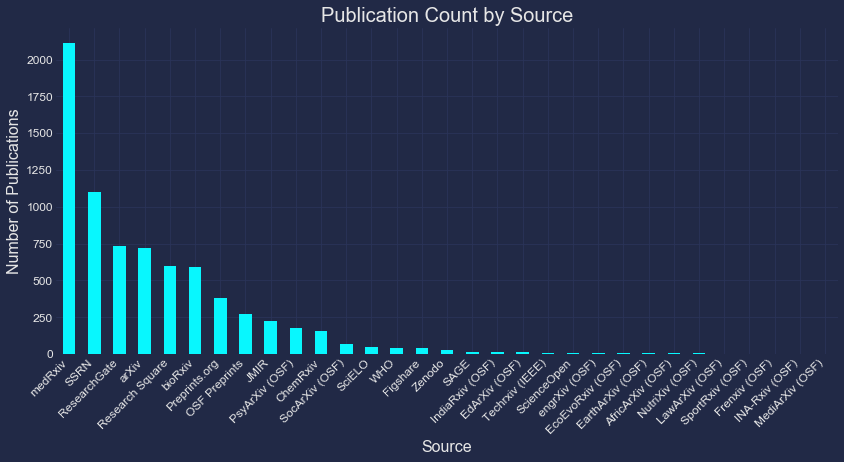

In [6]:
# Publication Count by Source 
plt.style.use('cyberpunk')
fig,ax = plt.subplots(figsize=(14,6))

source_counts = df['source'].value_counts()
source_counts.plot(kind='bar', #color=sns.color_palette('plasma_r', int(len(df.source.unique()))), 
                    linewidth=0, ax=ax)
ax.set_title('Publication Count by Source', fontsize=20)
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12)
ax.set_xlabel('Source', fontsize=16)
ax.set_ylabel('Number of Publications', fontsize=16)

mplcyberpunk.add_glow_effects()

medRxiv is the most prominent with SSRN being a distant second.


Let's look at how publications have trended over time:

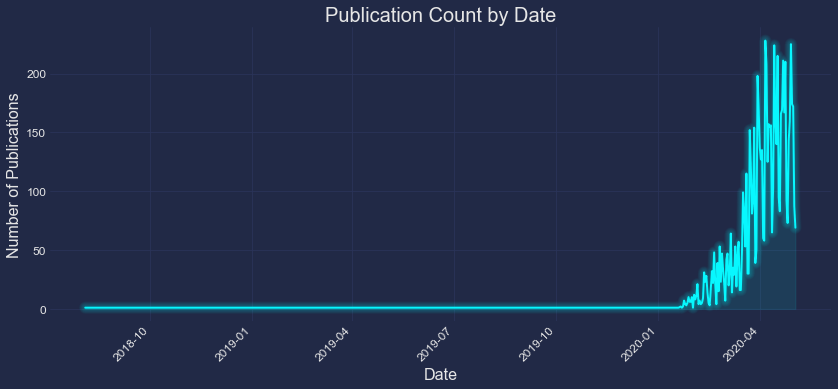

In [7]:
# Publication Count by Date
titles_date = df['posted_date'].value_counts()

plt.style.use('cyberpunk')
fig,ax = plt.subplots(figsize=(14,6))

titles_date.plot(kind='line', x='posted_date', 
                 #color='teal', 
                 linewidth=2, ax=ax)
ax.set_title('Publication Count by Date', fontsize=20)
plt.xticks(fontsize=12, rotation=45, ha='right')
plt.yticks(fontsize=12)
ax.set_xlabel('Date', fontsize=16)
ax.set_ylabel('Number of Publications', fontsize=16)

mplcyberpunk.add_glow_effects()

The above seems to clearly illustrate the frenzy in which we find ourselves compared to previous years. Let's zoom in on the current year: 2020

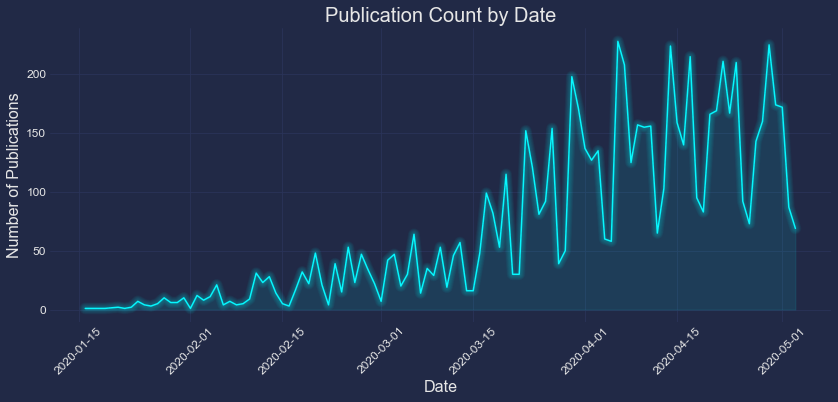

In [8]:
# Plotting Publications in 2020

plt.style.use("cyberpunk")

# Publication Count by Date in 2020
only2020 = df[df['posted_date']>'2020-01-01']

titles_date2020 = only2020['posted_date'].value_counts()

#plt.style.use('dark_background')
fig,ax = plt.subplots(figsize=(14,6))


titles_date2020.plot(kind='line', x='posted_date', 
                 #color='teal', alpha=0.7, linewidth=2, 
                     label='Date',ax=ax)


ax.set_title('Publication Count by Date', fontsize=20)
plt.xticks(fontsize=12, rotation=45, ha='center')
plt.yticks(fontsize=12)
ax.set_xlabel('Date', fontsize=16)
ax.set_ylabel('Number of Publications', fontsize=16)

mplcyberpunk.add_glow_effects(ax)


After 3/15/20, the troughs seem to be pretty evenly spaced out. I have a theory regarding this...

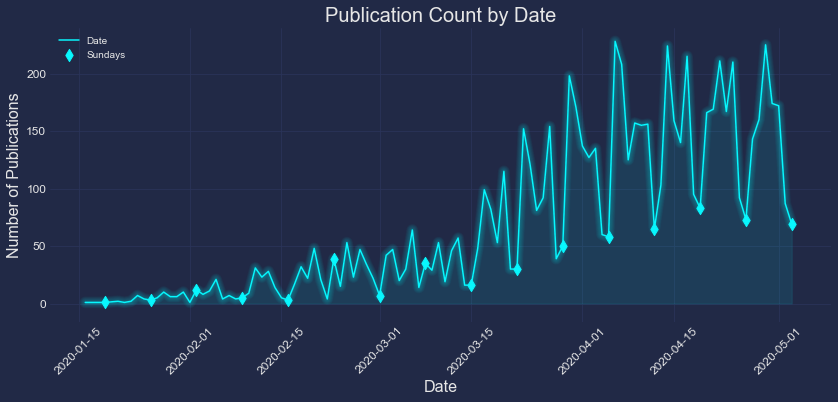

In [9]:
# Weekends?
plt.style.use("cyberpunk")

# Publication Count by Date in 2020
only2020 = df[df['posted_date']>'2020-01-01']

titles_date2020 = only2020['posted_date'].value_counts()

fig,ax = plt.subplots(figsize=(14,6))


titles_date2020.plot(kind='line', x='posted_date', label='Date',ax=ax)

# Show publication by day of week
# sunday pubs
sundays = df.groupby(df[df['posted_date'].dt.dayofweek==6].posted_date.dt.date).count().posted_date
ax.scatter(sundays.index, sundays, #color='m',
           marker='d', s=75, label='Sundays')


ax.set_title('Publication Count by Date', fontsize=20)
plt.xticks(fontsize=12, rotation=45, ha='center')
plt.yticks(fontsize=12)
ax.set_xlabel('Date', fontsize=16)
ax.set_ylabel('Number of Publications', fontsize=16)
ax.legend();

mplcyberpunk.add_glow_effects(ax)


Yes, in the past two months, output has skyrocketed, but it appears many scientists are taking more regular weekends. As the husband of a scientist, hopefully their rest fights burnout and aids in finding more and better information over the long-term. 

# Feature Engineering and NLP
___ 


In order to categorize the articles we will be using NLP via vectorization and Latent Dirichlet Allocation

In [10]:
# Creating a copy of the df so there is always a way to start over if needed without re-pulling the data
covid = df.copy()

Not every observation has information in the `abstract`, so we will be filling with an empty string to combine with `title`

In [11]:
# Filling the abstract column's NaN values with an empty string so they can be merged effectively with title
covid.abstract.fillna(' ', inplace=True)

covid.head()

,source,doi,arxiv_id,posted_date,title,abstract
0,AfricArXiv (OSF),10.31730/osf.io/e7bk4,NaN,2020-04-02,"ACE-2 in the highlight of COVID-19, A proposed...",<p>Pneumonia caused by the novel corona virus ...
1,AfricArXiv (OSF),10.31730/osf.io/b7eqj,NaN,2020-04-28,Covid-19 et handicap mental/Autisme et autres ...,<p>The Covid-19 is challenging our health syst...
2,AfricArXiv (OSF),10.31730/osf.io/65b8f,NaN,2020-05-02,Ghana’s Preparedness Now and For Future Pandemics,<p>The future of nations in the face of the ra...
3,AfricArXiv (OSF),10.31730/osf.io/sw6g2,NaN,2020-04-30,PSYCHOLOGICAL DISTRESS EXPERIENCES OF NIGERIAN...,<p>This study examined the psychological distr...
4,AfricArXiv (OSF),10.31730/osf.io/sy54p,NaN,2020-03-10,THE CAUSE OF PANIC AT THE OUTBREAK OF COVID-19...,<p>Lack of proper messaging at an outbreak of ...


In [12]:
covid['title_abstract'] = covid['title'] + ' ' + covid['abstract']

covid.drop(['arxiv_id','doi', 'title', 'abstract'], axis=1, inplace=True)

covid.head()

,source,posted_date,title_abstract
0,AfricArXiv (OSF),2020-04-02,"ACE-2 in the highlight of COVID-19, A proposed..."
1,AfricArXiv (OSF),2020-04-28,Covid-19 et handicap mental/Autisme et autres ...
2,AfricArXiv (OSF),2020-05-02,Ghana’s Preparedness Now and For Future Pandem...
3,AfricArXiv (OSF),2020-04-30,PSYCHOLOGICAL DISTRESS EXPERIENCES OF NIGERIAN...
4,AfricArXiv (OSF),2020-03-10,THE CAUSE OF PANIC AT THE OUTBREAK OF COVID-19...


In [13]:
covid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7380 entries, 0 to 7379
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   source          7380 non-null   object        
 1   posted_date     7380 non-null   datetime64[ns]
 2   title_abstract  7380 non-null   object        
dtypes: datetime64[ns](1), object(2)
memory usage: 230.6+ KB


Here we are performing formatting, lemmatizing, stemming, and adding common covid-related words to NLTKs stop words.

In [14]:
# NLP processing, stemming

# creating a list of extra stop words to filter out and help differentiate the articles
covid_words = ['coronavirus','corona','virus','covid','ncov','novel','sars', 'sar', 'nan']

stop_words = stopwords.words('english')
stop_words.extend(covid_words)
stemmer = SnowballStemmer("english")


TAGS = re.compile('<.*?>')
PUNCT = re.compile("([.;:!\'?,\"()\[\]])|(\-)|(\/)|(\\n)|(\*)")


def formatting(body):
    body = body.lower()
    body = TAGS.sub(' ', body)
    body = PUNCT.sub(' ', body)
    body = body.replace('\\n', ' ')
    return body

def RemoveCovidWords(toPrint):
    pattern = re.compile(r"\b(" + "|".join(covid_words) + ")\\W", re.I)
    return pattern.sub("", toPrint)

def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

# Tokenize and lemmatize
def preprocess(text):
    result=[]
    for token in gensim.utils.simple_preprocess(text) :
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))         
    return ' '.join(result)

In [15]:
# Applying above functions to the df
covid['title_abstract'] = covid.title_abstract.apply(formatting)
covid['title_abstract'] = covid.title_abstract.apply(preprocess)
covid['title_abstract'] = covid.title_abstract.apply(RemoveCovidWords)
covid.head()

,source,posted_date,title_abstract
0,AfricArXiv (OSF),2020-04-02,highlight propos patholog potenti correl pneum...
1,AfricArXiv (OSF),2020-04-28,handicap mental autism autr maladi rare challe...
2,AfricArXiv (OSF),2020-05-02,ghana prepared futur pandem futur nation face ...
3,AfricArXiv (OSF),2020-04-30,psycholog distress experi nigerian amid pandem...
4,AfricArXiv (OSF),2020-03-10,caus panic outbreak south africa compar analys...


Using a TF-IDF vectorizer gives us word importances by multiplying the frequency of each word (TF - term frequency) by how often it doesn't appear in the corpus (IDF - Inverse Document Frequency). We are filtering by the 1000 most important words in the entire corpus (all of the words in the `title_abstract` columns combined).

In [16]:
# TF-IDF
#1.0
#tfidf = TfidfVectorizer(stop_words='english', max_df=1.0, min_df=2, max_features=2000)

#.3
#tfidf = TfidfVectorizer(stop_words='english', max_df=.3, min_df=2, max_features=2000)

#.5
tfidf = TfidfVectorizer(stop_words=stop_words, max_df=.5, min_df=2, max_features=1000)


# fit / transform
fitted_vectorizer=tfidf.fit(covid.title_abstract)
tfidf_vectors=fitted_vectorizer.transform(covid.title_abstract)

# to data frame with words as columns
covid_tfidf = pd.DataFrame(tfidf_vectors.toarray(), columns=tfidf.get_feature_names())

covid_tfidf.head()

,abil,abl,abnorm,absenc,abstract,acceler,access,accord,account,accur,...,wide,widespread,women,work,worker,world,worldwid,wuhan,year,york
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.078793,0.0,0.0,0.0,0.00000
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.131298,0.0,0.0,0.0,0.00000
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.07345


Creating a column with the top 10 words for each article, which we will use for labeling the later plots.

In [17]:
# New column with top 10 most import words in each title/abstract
# Interactive plot that shows the top 10 from TFIDF on hover 

top_tens=[]
for i in range(covid_tfidf.shape[0]):
    row = covid_tfidf.iloc[i]
    top_tens.append(" ".join(list(row[row>0].sort_values(ascending=False)[:10].index)))

covid_tfidf['tfidf_top_tens'] = pd.Series(top_tens)

In [18]:
covid_tfidf[:].head()

,abil,abl,abnorm,absenc,abstract,acceler,access,accord,account,accur,...,widespread,women,work,worker,world,worldwid,wuhan,year,york,tfidf_top_tens
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.078793,0.0,0.0,0.0,0.00000,patholog correl mean target potenti view bring...
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.131298,0.0,0.0,0.0,0.00000,mental social content https life final discuss...
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,nation plan futur govern pandem like africa tu...
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,depress moder male gender report sever anxieti...
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.07345,africa south communic outbreak lack indic auth...


In [19]:
# Counting blank values
# These will be removed later
count = 0
for i in covid_tfidf['tfidf_top_tens']: 
    if len(i) < 1 :
        count+=1
print(f'blank values count: {count}')

blank values count: 158


## LDA
___


Latent Dirichlet Allocation will give us a breakdown of classes that the articles can fall into. I have used multiple subdivisions in my tests, and have landed on 3 total subdivisions based on clustering, which we will get to later.

In [20]:
# LDA and TF Vectorizer
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += " ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message+'\n')
    print()
    
tf_vectorizer = CountVectorizer(max_df=0.5, min_df=2,
                                max_features=1000,
                                stop_words=stop_words)

tf = tf_vectorizer.fit_transform(covid.title_abstract)

lda = LatentDirichletAllocation(n_components=3, max_iter=10,
                                learning_method='online',
                                learning_offset=20.,
                                n_jobs=-1,
                               random_state=random_state)

lda.fit(tf)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=20.0,
                          max_doc_update_iter=100, max_iter=10,
                          mean_change_tol=0.001, n_components=3, n_jobs=-1,
                          perp_tol=0.1, random_state=222, topic_word_prior=None,
                          total_samples=1000000.0, verbose=0)

In [21]:
print("\nTopics in LDA model:")
tf_feature_names = tf_vectorizer.get_feature_names()
print_top_words(lda, tf_feature_names, 20)


Topics in LDA model:
Topic #0: drug protein cell infect human viral bind potenti studi target vaccin sequenc genom express identifi structur receptor host diseas immun

Topic #1: patient clinic sever diseas test studi case infect hospit result symptom method detect group pneumonia risk treatment respiratori includ conclus

Topic #2: model case infect epidem pandem data number health countri spread outbreak time measur effect social estim diseas china public popul




* Topic 0 - Pathogen
* Topic 1 - Patient
* Topic 2 - Population

Now we will assign LDA topic categories based on the below probabilites.

In [22]:
# DF with LDA probabilities per label
lda_vectors=lda.transform(tf)

covid_lda = pd.DataFrame(lda_vectors)

covid_lda.info()
covid_lda.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7380 entries, 0 to 7379
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       7380 non-null   float64
 1   1       7380 non-null   float64
 2   2       7380 non-null   float64
dtypes: float64(3)
memory usage: 173.1 KB


,0,1,2
0,0.578737,0.133495,0.287768
1,0.103048,0.007499,0.889454
2,0.011009,0.009274,0.979718
3,0.003928,0.781135,0.214937
4,0.002916,0.002768,0.994317


In [23]:
# New column for highest probability topic per row based on tf
covid_lda['prob_topic'] = [covid_lda.loc[i].sort_values(ascending=False).index[0] for i in range(covid_lda.shape[0])]

covid_lda.tail()

,0,1,2,prob_topic
7375,0.037900,0.004972,0.957128,2
7376,0.007801,0.140969,0.851231,2
7377,0.031558,0.276008,0.692434,2
7378,0.008179,0.007118,0.984703,2
7379,0.029862,0.007818,0.962320,2


Let's look at the the breakdown of topic totals:

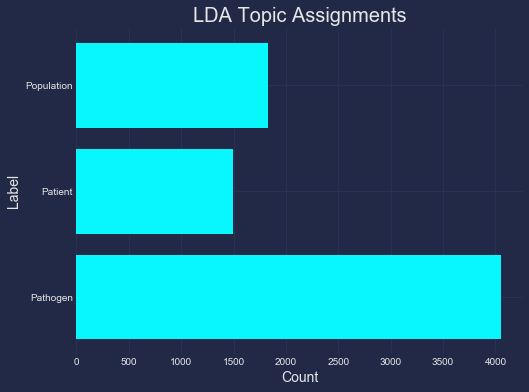

In [24]:
plt.style.use("cyberpunk")

plt.figure(figsize=(8,6))

plt.barh(covid_lda.prob_topic.unique(), covid_lda.prob_topic.value_counts())
plt.title('LDA Topic Assignments', fontsize=20)
plt.ylabel('Label', fontsize=14)
plt.xlabel('Count', fontsize=14)
_=plt.yticks(range(0,int(covid_lda.prob_topic.nunique())), labels=['Pathogen', 'Patient','Population'])

mplcyberpunk.add_glow_effects()

In [25]:
top10s_labels = pd.concat([covid_tfidf['tfidf_top_tens'], 
                           #covid_tf_df['tf_df_top_tens'], 
                           covid_lda['prob_topic']], axis=1)

top10s_labels.head()

,tfidf_top_tens,prob_topic
0,patholog correl mean target potenti view bring...,0
1,mental social content https life final discuss...,2
2,nation plan futur govern pandem like africa tu...,2
3,depress moder male gender report sever anxieti...,1
4,africa south communic outbreak lack indic auth...,2


## Decomposition
___
Let's look at a couple decomposition algorithms to see which would be best for viewing the data.


<br></br>
### 1. UMAP
   * UMAP was chosen first for its quickness

In [26]:
covid_tfidf.head()

,abil,abl,abnorm,absenc,abstract,acceler,access,accord,account,accur,...,widespread,women,work,worker,world,worldwid,wuhan,year,york,tfidf_top_tens
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.078793,0.0,0.0,0.0,0.00000,patholog correl mean target potenti view bring...
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.131298,0.0,0.0,0.0,0.00000,mental social content https life final discuss...
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,nation plan futur govern pandem like africa tu...
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,depress moder male gender report sever anxieti...
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.07345,africa south communic outbreak lack indic auth...


In [27]:
X = covid_tfidf[covid_tfidf['tfidf_top_tens']!=''].iloc[:,:-1].dropna()
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [ ]:
# Running multiple hyperparams for UMAP on X
metric =[#'correlation',
         'hellinger' # Hellinger seems to work best
         #euclidean, - unhelpful
         #cosine - not great - 7,1,cosine interesting
        ] 
 


for i in metric:
    umap_results = umap.UMAP(metric=i,
                             n_components=3,
                            random_state=random_state).fit_transform(X)

    fig = go.Figure(data=[go.Scatter3d(
        x=umap_results[:,0],
        y=umap_results[:,1],
        z=umap_results[:,2],
        mode='markers',
        marker=dict(
            size=3,
            color=top10s_labels.prob_topic, 
            colorscale='jet',
            opacity=0.7
        ),
    )])

    # tight layout
    fig.update_layout(height=500,
                      width=500,
                      margin=dict(l=0, r=0, b=0, t=0),
                     paper_bgcolor='#000000',
                     plot_bgcolor='#000000',
                     scene=dict(xaxis=dict(visible=False,
                                          ),
                                yaxis=dict(visible=False
                                          ),
                                zaxis=dict(visible=False
                                          )
                               )
                     )
    fig.show()
    print('\n')
    # Output cleared as its too big to host on github. Hellinger looks best.

In [ ]:
# Further UMAP Hellinger param testing
dist = [0.1, #0.3, 0.5
       ]
neighbors = [#5,10,
             15]
#dist .1 & neighbors 15 works best
for j in dist:
    for k in neighbors:
        print(f'Neighbors: {k}, Dist: {j}')
        umap_results = umap.UMAP(n_neighbors=k, 
                                 min_dist=j, 
                                 metric='hellinger',
                                 n_components=3,
                                random_state=random_state).fit_transform(X)

        fig = go.Figure(data=[go.Scatter3d(
            x=umap_results[:,0],
            y=umap_results[:,1],
            z=umap_results[:,2],
            mode='markers',
            marker=dict(
                size=3,
                color=top10s_labels.prob_topic, 
                colorscale='jet',
                opacity=0.7
            ),
        )])

        # tight layout
        fig.update_layout(height=500,
                          width=500,
                          margin=dict(l=0, r=0, b=0, t=0),
                         paper_bgcolor='#000000',
                         plot_bgcolor='#000000',
                         scene=dict(xaxis=dict(visible=False,
                                              ),
                                    yaxis=dict(visible=False
                                              ),
                                    zaxis=dict(visible=False
                                              )
                                   )
                         )
        fig.show()
        print('\n')
        # Output cleared due to size

In [30]:
# UMAP visual with best params for X and predicted LDA overlay
umap_results = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='hellinger', 
                         n_components=3, random_state=random_state).fit_transform(X)

fig = go.Figure(data=[go.Scatter3d(
            x=umap_results[:,0],
            y=umap_results[:,1],
            z=umap_results[:,2],
            mode='markers',
            marker=dict(
                size=3,
                color=covid_lda.prob_topic, 
                colorscale='viridis',
            ),
        hovertemplate =
            '<b>Main Topics</b>:<br>%{text}</br><extra></extra>',
            text = ['{}'.format(i) for i in top10s_labels.tfidf_top_tens],
            #hovertext=['{}'.format(i) for i in covid.source],
        )])


fig.update_layout(height=500,
                  width=500,
                  title_text='UMAP with LDA Topic Overlay',
                  margin=dict(l=0, r=0, b=0, t=40),
                 paper_bgcolor='#000000',
                 plot_bgcolor='#000000',
                 scene=dict(xaxis=dict(visible=False,
                                      ),
                            yaxis=dict(visible=False
                                      ),
                            zaxis=dict(visible=False
                                      )
                           )
                 )
fig.show()
print('\n')

Ignoring the color, overall, there is still not a lot of group separation when using UMAP on this dataset.

### 2. T-SNE

In [31]:
# TruncatedSVD
# Helpful for to run on sparse matrices before TSNE per sklearn docs
tsvd = TruncatedSVD(n_components=50, algorithm='randomized', n_iter=5)
tsvd_results = tsvd.fit_transform(X_std)

In [32]:
metrics = ['correlation',#'cosine', 'euclidean', 'l1','l2','manhattan',
          ]

for i in metrics:
    print(f'Metric: {i}')
    tsne = TSNE(n_components=3, verbose=1, perplexity=40, metric=i, n_iter=400, 
                n_jobs=-1, random_state=random_state)
    tsne_results = tsne.fit_transform(tsvd_results)

    tsne_results_df = pd.DataFrame(tsne_results)

    # TSNE 3D
    fig = go.Figure(data=[go.Scatter3d(
        x=tsne_results[:,0],
        y=tsne_results[:,1],
        z=tsne_results[:,2],
        mode='markers',
        marker=dict(
            size=3,
            color=top10s_labels.prob_topic, 
            colorscale='jet',
            opacity=0.7
        ),

        #hovertemplate =
        #'<b>Main Topics</b>:<br>%{text}</br><extra></extra>',
        #text = ['{}'.format(i) for i in top10s_labels.tfidf_top_tens],
        #hovertext=['{}'.format(i) for i in covid.source],

    )])

    # tight layout
    fig.update_layout(height=300,
                      width=300,
                      margin=dict(l=0, r=0, b=0, t=0),
                     paper_bgcolor='#000000',
                     plot_bgcolor='#000000',
                     scene=dict(xaxis=dict(visible=False,
                                          ),
                                yaxis=dict(visible=False
                                          ),
                                zaxis=dict(visible=False
                                          )
                               ),
                      dragmode='orbit'
                     )
    fig.show()

Metric: correlation
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 7222 samples in 0.001s...
[t-SNE] Computed neighbors for 7222 samples in 4.950s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7222
[t-SNE] Computed conditional probabilities for sample 2000 / 7222
[t-SNE] Computed conditional probabilities for sample 3000 / 7222
[t-SNE] Computed conditional probabilities for sample 4000 / 7222
[t-SNE] Computed conditional probabilities for sample 5000 / 7222
[t-SNE] Computed conditional probabilities for sample 6000 / 7222
[t-SNE] Computed conditional probabilities for sample 7000 / 7222
[t-SNE] Computed conditional probabilities for sample 7222 / 7222
[t-SNE] Mean sigma: 0.232195
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.268219
[t-SNE] KL divergence after 400 iterations: 1.760312


Of all the TSNE sample metrics run, none of them were effective. Correlation shown for proof of how poorly it did. 

### 2. PCA

In [33]:
# ML Variables
X = covid_tfidf.iloc[:,:-1].dropna()

scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [34]:
# PCA 3D
pca = PCA(n_components=3).fit_transform(X_std)

fig = go.Figure(data=[go.Scatter3d(
    x=pca[:,0],
    y=pca[:,1],
    z=pca[:,2],
    mode='markers',
    marker=dict(
        size=3,
        color=top10s_labels.prob_topic, 
        colorscale='viridis',
    ),
    


)])

# tight layout
fig.update_layout(height=400,
                  width=400,
                  title_text='PCA',
                  margin=dict(l=0, r=0, b=0, t=40),
                 paper_bgcolor='#000000',
                 plot_bgcolor='#000000',
                 scene=dict(xaxis=dict(visible=False,
                                      ),
                            yaxis=dict(visible=False
                                      ),
                            zaxis=dict(visible=False
                                      )
                           ),
                  dragmode='orbit'
                 )

fig.show()

This result looks very promising, let's continue to use this during clustering.

# Clustering
___

In [35]:
# Cluster metrics to be used later
def clustering_metrics(labels_pred, labels_true, df, sil_metric):
    
    print(f'Homogeneity: {sklearn.metrics.homogeneity_score(labels_true, labels_pred)}')
    print(f'Completeness: {sklearn.metrics.completeness_score(labels_true, labels_pred)}')
    print(f'V Measure: {sklearn.metrics.v_measure_score(labels_true, labels_pred)}')
    print(f'ARI: {sklearn.metrics.adjusted_rand_score(labels_true, labels_pred)}')

    print(f'Silhouette Score: {silhouette_score(df, labels_pred, metric=sil_metric)}')

    

### 1. DBSCAN

In [36]:
X = covid_tfidf.iloc[:,:-1].dropna()
#Y = covid.source_fact

scaler = StandardScaler()
X_std = scaler.fit_transform(X)

In [37]:
# DBSCAN Params
for i in np.arange(.5, 1.2, .2):
    print(f"eps={i}\n"+('-'*50))
    for j in range(4,9):
        dbscan_cluster = DBSCAN(eps=i, min_samples=j, metric="cosine", n_jobs=-1) # no random state option
        #cosine, euclidean, manhattan were all tried and did not perform well
        # Fit model
        clusters = dbscan_cluster.fit_predict(X_std)
        print(f"Number of clusters when min_samples={j} is: {len(np.unique(clusters))}")
    print('\n')

eps=0.5
--------------------------------------------------
Number of clusters when min_samples=4 is: 172
Number of clusters when min_samples=5 is: 124
Number of clusters when min_samples=6 is: 104
Number of clusters when min_samples=7 is: 81
Number of clusters when min_samples=8 is: 60


eps=0.7
--------------------------------------------------
Number of clusters when min_samples=4 is: 3
Number of clusters when min_samples=5 is: 3
Number of clusters when min_samples=6 is: 2
Number of clusters when min_samples=7 is: 2
Number of clusters when min_samples=8 is: 3


eps=0.8999999999999999
--------------------------------------------------
Number of clusters when min_samples=4 is: 1
Number of clusters when min_samples=5 is: 1
Number of clusters when min_samples=6 is: 1
Number of clusters when min_samples=7 is: 1
Number of clusters when min_samples=8 is: 1


eps=1.0999999999999999
--------------------------------------------------
Number of clusters when min_samples=4 is: 1
Number of cluste

In [38]:
# DBSCAN Model

dbscan_cluster = DBSCAN(eps=.7, min_samples=8, metric="cosine")
# Fit model
dbscan_clusters = dbscan_cluster.fit_predict(X_std)

In [39]:
# DBSCAN 3D Cluster w/ PCA
fig = go.Figure(data=[go.Scatter3d(
    x=pca[:,0],
    y=pca[:,1],
    z=pca[:,2],
    mode='markers',
    marker=dict(
        size=3,
        color=[dbscan_clusters[i] for i in range(dbscan_clusters.shape[0])], 
        colorscale='jet',
        opacity=0.7
    ),
    
   # hovertemplate =
   # '<b>Main Topics</b>:<br>%{text}</br><extra></extra>',
   # text = ['{}'.format(i) for i in top10s_labels.tfidf_top_tens],
    #hovertext=['{}'.format(i) for i in covid.source],

)])

# tight layout
fig.update_layout(height=600, 
                  width=800,
                  margin=dict(l=0, r=0, b=0, t=40),
                  title_text='DBSCAN with PCA',
                 paper_bgcolor='#000000',
                 plot_bgcolor='#000000',
                 scene=dict(xaxis=dict(visible=False,
                                      ),
                            yaxis=dict(visible=False
                                      ),
                            zaxis=dict(visible=False
                                      )
                           )
                 )
fig.show()

In [40]:
# DBSCAN 3D Cluster w/ UMAP
fig = go.Figure(data=[go.Scatter3d(
    x=umap_results[:,0],
    y=umap_results[:,1],
    z=umap_results[:,2],
    mode='markers',
    marker=dict(
        size=3,
        color=[dbscan_clusters[i] for i in range(dbscan_clusters.shape[0])], 
        colorscale='jet',
    ),
    
    hovertemplate =
    '<b>Main Topics</b>:<br>%{text}</br><extra></extra>',
    text = ['{}'.format(i) for i in covid_tfidf.tfidf_top_tens],
    #hovertext=['{}'.format(i) for i in covid.source],

)])

# tight layout
fig.update_layout(height=400,
                  width=400,
                  margin=dict(l=0, r=0, b=0, t=40),
                  title_text='DBSCAN with UMAP',
                 paper_bgcolor='#000000',
                 plot_bgcolor='#000000',
                 scene=dict(xaxis=dict(visible=False,
                                      ),
                            yaxis=dict(visible=False
                                      ),
                            zaxis=dict(visible=False
                                      )
                           )
                 )
fig.show()

In [41]:
clustering_metrics(labels_pred=dbscan_clusters, labels_true=covid_lda.prob_topic, df=X_std, sil_metric='cosine')

Homogeneity: 0.006555741719769487
Completeness: 0.017745775562771186
V Measure: 0.00957444095806368
ARI: -0.025749859340683797
Silhouette Score: -0.0051967251145745635


DBSCAN does not perform well in its metrics, nor do the visuals look promising. With an eps of 1, DBSCAN sees only 1 cluster and anything below 1 does not cluster at all. 

## Heirarchical Clustering
___

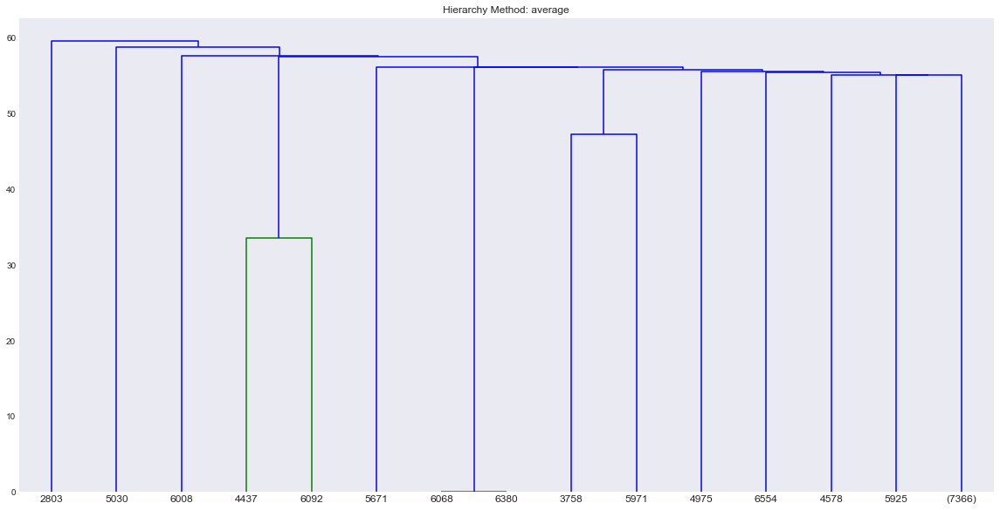

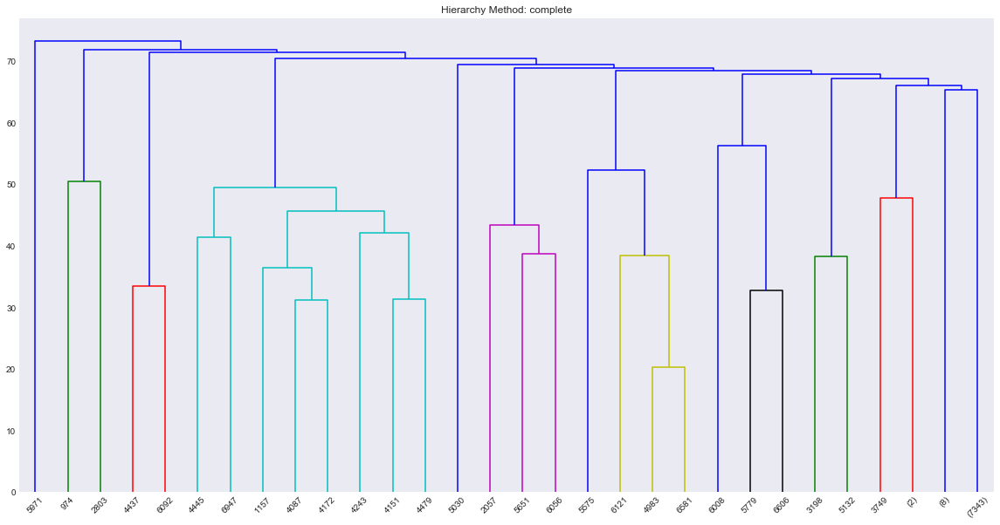

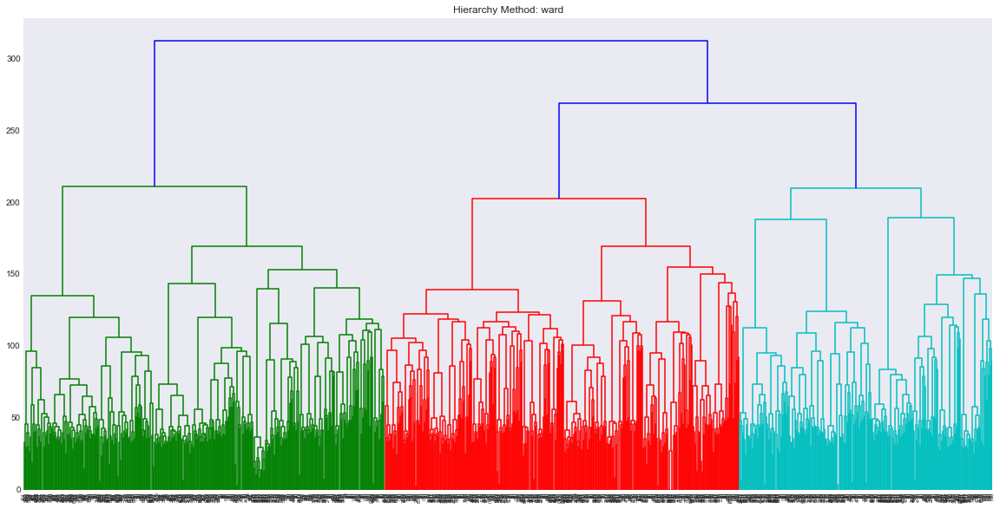

In [42]:
methods = ['average', 'complete', 'ward']

for i in range(3):
    plt.style.use('seaborn-dark')
    plt.figure(figsize=(20,10))
    dendrogram(linkage(X_std, method=methods[i]), p=10, truncate_mode='level')
    plt.title(f'Hierarchy Method: {methods[i]}')
    plt.show()
    print('\n')

The best method looks to be Ward. Drawing a horizontal line perpendicular to the longest stem, this gives us 3 clusters. (This clustering method is also why we chose 3 LDA topics)

In [43]:
# heirarchical 
cluster = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward') 
# only euclidean is accepted
hier_clusters = cluster.fit_predict(X)

# heirarchical clustering w/ PCA 3D
pca = PCA(n_components=3).fit_transform(X_std)
marker_list={0:("circle-open",3), 1:("square-open",3), 2:("cross",3)}


fig = go.Figure(data=[go.Scatter3d(
    x=pca[:,0],
    y=pca[:,1],
    z=pca[:,2],
    mode='markers',
    marker=dict(
        symbol=[marker_list[i][0] for i in covid_lda.prob_topic],
        size=5,#[marker_list[i][1] for i in covid_lda.prob_topic],
        color=cluster.labels_, 
        colorscale='Agsunset',
    ),
    hovertemplate =
    '<b>Main Topics</b>:<br>%{text}</br><extra></extra>',
    text = ['{}'.format(i) for i in covid_tfidf.tfidf_top_tens],
    #hovertext=['{}'.format(i) for i in covid.source],

)])

# tight layout
fig.update_layout(title_text='Hierarchical Clustering with PCA <br>Clusters - Colors</br>Shapes - LDA Topic',
                  height=600, 
                  width=800,
                  margin=dict(l=0, r=0, b=0, t=40),
                 paper_bgcolor='#000000',
                 plot_bgcolor='#000000',
                 dragmode='orbit',
                 scene=dict(xaxis=dict(visible=False,
                                      ),
                            yaxis=dict(visible=False
                                      ),
                            zaxis=dict(visible=False
                                      ),
                            annotations=[dict(
                                showarrow=False,
                                x=-5,
                                y=19,
                                z=-1,
                                text="Patients",
                                xanchor="center",
                                font=dict(
                                    color="white",
                                    size=12
                                )
                            ), dict(
                                showarrow=False,
                                x=-7,
                                y=-3,
                                z=9,
                                text="Population",
                                xanchor='center',
                                font=dict(
                                    color="white",
                                    size=12
                                ),
                            ), dict(
                                showarrow=False,
                                x=15,
                                y=-0.3,
                                z=9,
                                text="Pathogen",
                                xanchor='center',
                                font=dict(
                                    color="white",
                                    size=12
                                ),
                               hoverlabel=dict(bgcolor='white'),
                            )
                        ]
                    )
                )
camera = dict(
    up=dict(x=1, y=0, z=0),
    center=dict(x=-.1, y=0, z=0),
    eye=dict(x=-.1, y=1.25, z=1.25)
)

fig.update_layout(scene_camera=camera)



fig.show()

In [44]:
clustering_metrics(labels_pred=hier_clusters, labels_true=covid_lda.prob_topic, df=X, sil_metric='cosine')

Homogeneity: 0.23312472847897273
Completeness: 0.26501096472329855
V Measure: 0.24804730935023833
ARI: 0.09278259620314315
Silhouette Score: 0.012229748011259596


These metrics are a big improvement over DBSCAN, but there seems to be quite a bit of overlap in the center making our ARI not very accurate. Let's look at a few more clustering models.

## GMM
___

In [45]:
X = covid_tfidf.iloc[:,:-1].dropna()

scaler = StandardScaler()
X_std = scaler.fit_transform(X)

gmm = GaussianMixture(n_components=3, random_state=random_state)
gmm_clusters = gmm.fit_predict(X_std)

# GMM clustering w/ PCA 3D
fig = go.Figure(data=[go.Scatter3d(
    x=pca[:,0],
    y=pca[:,1],
    z=pca[:,2],
    mode='markers',
    marker=dict(
        symbol=[marker_list[i][0] for i in covid_lda.prob_topic],
        size=5,#[marker_list[i][1] for i in covid_lda.prob_topic],
        color=[gmm_clusters[i] for i in range(gmm_clusters.shape[0])],
        colorscale='Agsunset',
    ),
    hovertemplate =
    '<b>Main Topics</b>:<br>%{text}</br><extra></extra>',
    text = ['{}'.format(i) for i in covid_tfidf.tfidf_top_tens],
    #hovertext=['{}'.format(i) for i in covid.source],

)])

# tight layout
fig.update_layout(title_text='GMM Clustering with PCA <br>Clusters - Colors</br>Shapes - LDA Topic',
                  height=600, 
                  width=800,
                  margin=dict(l=0, r=0, b=0, t=40),
                 paper_bgcolor='#000000',
                 plot_bgcolor='#000000',
                 dragmode='orbit',
                 scene=dict(xaxis=dict(visible=False,
                                      ),
                            yaxis=dict(visible=False
                                      ),
                            zaxis=dict(visible=False
                                      ),
                            annotations=[dict(
                                showarrow=False,
                                x=-5,
                                y=19,
                                z=-1,
                                text="Patients",
                                xanchor="center",
                                font=dict(
                                    color="white",
                                    size=12
                                )
                            ), dict(
                                showarrow=False,
                                x=-7,
                                y=-3,
                                z=9,
                                text="Population",
                                xanchor='center',
                                font=dict(
                                    color="white",
                                    size=12
                                ),
                            ), dict(
                                showarrow=False,
                                x=15,
                                y=-0.3,
                                z=9,
                                text="Pathogen",
                                xanchor='center',
                                font=dict(
                                    color="white",
                                    size=12
                                ),
                               hoverlabel=dict(bgcolor='white'),
                            )
                        ]
                    )
                )
camera = dict(
    up=dict(x=1, y=0, z=0),
    center=dict(x=-.1, y=0, z=0),
    eye=dict(x=-.1, y=1.25, z=1.25)
)

fig.update_layout(scene_camera=camera)



fig.show()

In [46]:
# Clustering Metrics
clustering_metrics(labels_pred=gmm_clusters, labels_true=covid_lda.prob_topic, df=X_std, sil_metric='cosine')

Homogeneity: 0.45926466121093895
Completeness: 0.5461970663713244
V Measure: 0.498972767953341
ARI: 0.5089490617685577
Silhouette Score: 0.015710469610242354


The GMM model performs much better in all metrics. 

# Spectral Clustering
___

In [47]:
affinity = ['rbf', 'poly', 'polynomial', 'laplacian', 'sigmoid', 'nearest_neighbors']

X_norm = normalize(X_std)

In [48]:
for i in range(len(affinity)):
    print(('_'*30) + f'\nAffinity: {affinity[i]}')
    spec_clusters = SpectralClustering(n_clusters=3, affinity=affinity[i], 
                                       random_state=random_state, n_jobs=-1).fit_predict(X_norm)
    
    silhouette = silhouette_score(X_norm, spec_clusters, metric='cosine')
    
    print(f'Silhouette Score: {silhouette}\n')

______________________________
Affinity: rbf
Silhouette Score: 0.0005691872724398378

______________________________
Affinity: poly
Silhouette Score: 0.0005746996022644015

______________________________
Affinity: polynomial
Silhouette Score: 0.0005746996022644015

______________________________
Affinity: laplacian
Silhouette Score: -0.02096747466740196

______________________________
Affinity: sigmoid
Silhouette Score: 0.025430143057910352

______________________________
Affinity: nearest_neighbors
Silhouette Score: -0.0010979022265763638



Sigmoid appears to have the best silhouette score

In [49]:
spectral = SpectralClustering(n_clusters=3, affinity='sigmoid', random_state=random_state)
spec_clusters = spectral.fit_predict(X_norm)

# Spectral Clustering with PCA

fig = go.Figure(data=[go.Scatter3d(
    x=pca[:,0],
    y=pca[:,1],
    z=pca[:,2],
    mode='markers',
    marker=dict(
        symbol=[marker_list[i][0] for i in covid_lda.prob_topic],
        size=5,#[marker_list[i][1] for i in covid_lda.prob_topic],
        color=spectral.labels_, 
        colorscale='viridis',
    ),
    hovertemplate =
    '<b>Main Topics</b>:<br>%{text}</br><extra></extra>',
    text = ['{}'.format(i) for i in covid_tfidf.tfidf_top_tens],
    #hovertext=['{}'.format(i) for i in covid.source],

)])

# tight layout
fig.update_layout(title_text='Spectral Clustering with PCA <br>Clusters - Colors</br>Shapes - LDA Topic',
                  height=600, 
                  width=800,
                  margin=dict(l=0, r=0, b=0, t=40),
                 paper_bgcolor='#000000',
                 plot_bgcolor='#000000',
                 dragmode='orbit',
                 scene=dict(xaxis=dict(visible=False,
                                      ),
                            yaxis=dict(visible=False
                                      ),
                            zaxis=dict(visible=False
                                      ),
                            annotations=[dict(
                                showarrow=False,
                                x=-5,
                                y=19,
                                z=-1,
                                text="Patients",
                                xanchor="center",
                                font=dict(
                                    color="white",
                                    size=12
                                )
                            ), dict(
                                showarrow=False,
                                x=-7,
                                y=-3,
                                z=9,
                                text="Population",
                                xanchor='center',
                                font=dict(
                                    color="white",
                                    size=12
                                ),
                            ), dict(
                                showarrow=False,
                                x=15,
                                y=-0.3,
                                z=9,
                                text="Pathogen",
                                xanchor='center',
                                font=dict(
                                    color="white",
                                    size=12
                                ),
                               hoverlabel=dict(bgcolor='white'),
                            )
                        ]
                    )
                )
camera = dict(
    up=dict(x=1, y=0, z=0),
    center=dict(x=-.1, y=0, z=0),
    eye=dict(x=-.1, y=1.25, z=1.25)
)

fig.update_layout(scene_camera=camera)



fig.show()

In [50]:

clustering_metrics(labels_pred=spec_clusters, labels_true=covid_lda.prob_topic, df=X_norm, sil_metric='cosine')

Homogeneity: 0.3386667211656986
Completeness: 0.3387273634761438
V Measure: 0.3386970396064822
ARI: 0.27544196739550914
Silhouette Score: 0.025430143057910352


In the graph above it's clear it is not clustering as well as GMM and the metrics agree.

# Conclusion:
___

Based on the visual and overall metrics, GMM is the best clustering algorithm.

* Homogeneity: 0.45926466121093895
* Completeness: 0.5461970663713244
* V Measure: 0.498972767953341
* ARI: 0.5089490617685577
* Silhouette Score: 0.015710469610242354

# Ways Forward:
___
While, I was originally hoping to be able to cluster 10-20 different topics, I am glad the model does well for the three main topics discovered. 

<br></br>
Potential further developments: 
* Separate the three main categories into their own dataframes to see if any sub-categories can be reliably detected
* Create a portal to access the API and sort via topic